In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [2]:
df = pd.read_csv('A England.csv',encoding='latin1')

In [6]:
df.drop('Column1',axis=1,inplace=True)

In [5]:
#df.drop('+/-',axis=1,inplace=True)

In [6]:
def change_int(column):
    
    clened = []

    for i in column:
        try:
            if math.isnan(i):
                clened.append(0)  # or any other appropriate value for NaN
            else:
                val = float(i)
                clened.append(val)
        except:
            clened.append(int(i.replace(',', '')) if isinstance(i, str) else None)
    return clened

In [7]:
df['Number no longer in HE'] = change_int(df['Number no longer in HE'])

In [8]:
df['Percentage no longer in HE (%)'] = df['Percentage no longer in HE (%)'].fillna(0)

In [9]:
df['Total full-time entrants'] = change_int( df['Total full-time entrants'])

In [10]:
df['Number who continue or qualify at same HEP'] = change_int(df['Number who continue or qualify at same HEP'])

In [11]:
def clean_float(column):
    clened = []
    for i in column:
        if math.isnan(i):
            val = 0.0
            clened.append(val)
        else:
            clened.append(float(i))

    df['Percentage who continue or qualify at same HEP (%)'] = clened
    
    return clened

In [12]:
df['Percentage who continue or qualify at same HEP (%)'] = clean_float(df['Percentage who continue or qualify at same HEP (%)'])

In [13]:
df['Adjusted sector continue or qualify (%)'] = clean_float(df['Adjusted sector continue or qualify (%)'])

In [14]:
df['Percentage who continue or qualify at same HEP (%)'] = clean_float(df['Percentage who continue or qualify at same HEP (%)'])

In [15]:
df['Adjusted sector transfer to other UK HEP (%)'] = clean_float(df['Adjusted sector transfer to other UK HEP (%)'])

In [16]:
df['Percentage who transfer to other UK HEP (%)'] = clean_float(df['Percentage who transfer to other UK HEP (%)'])

In [17]:
df['Benchmark (%)'] = clean_float(df['Benchmark (%)'])

In [18]:
#df['HE providerÃ\x82Â\x92s average contribution to benchmark (%)']  = clean_float(df['HE providerÂ\x92s average contribution to benchmark (%)']
           #)

In [19]:
df['Average number of HE providers in comparison'] = clean_float(df['Average number of HE providers in comparison'])

In [20]:
df['Standard deviation (%)'] = clean_float(df['Standard deviation (%)'])

In [7]:
df.drop('Unnamed: 0',axis=1,inplace=True)

# EDA

# Categories for churn level

Low Non-Continuation: 0.00% to 10.00%<br>
Moderate Non-Continuation: 10.01% to 30.00%<br>
High Non-Continuation: 30.01% to 60.00%<br>
Very High Non-Continuation: 60.01% to 100.00%<br>

In [41]:
# No need to run this code

churn_level = []

for value in df['Percentage no longer in HE (%)']:
    if value >= 0.00 and value <= 5.00:
        churn_level.append("Low")
    elif value > 5.00 and value <= 9.70:
        churn_level.append("Moderate")
    elif value > 9.70 and value <= 30.00:
        churn_level.append("High")
    elif value > 30.00 and value <= 58.10:
        churn_level.append("Very High")
    else:
        churn_level.append("Invalid")




In [42]:
df['Churn Level'] = churn_level

C:\Users\Siddharth\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn Level', ylabel='count'>

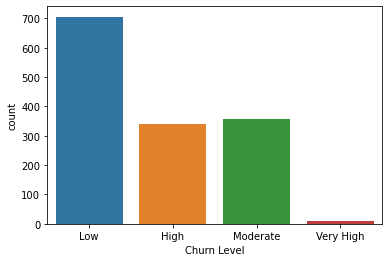

In [43]:
sns.countplot(df['Churn Level'])

In [44]:
#df.to_csv('England.csv')

In [6]:
df.drop('Unnamed: 0',axis=1,inplace=True)

# Demographic churn analysis

In [71]:
England_Groupby = df.groupby(['County','Year']).sum()

In [78]:
top_20_locations.groupby(['Location'])

low no longer mean HE

In [51]:
df[df['Location'] == 'Birmingham, England']

,Column1,HE PROVIDER,Total full-time entrants,Number who continue or qualify at same HEP,Percentage who continue or qualify at same HEP (%),Adjusted sector continue or qualify (%),Number who transfer to other UK HEP,Percentage who transfer to other UK HEP (%),Adjusted sector transfer to other UK HEP (%),Number no longer in HE,Percentage no longer in HE (%),Benchmark (%),Standard deviation (%),HE providerÂs average contribution to benchmark (%),Average number of HE providers in comparison,County,Year,Location,Churn Level


In [52]:
df.loc[df['Location'] == 'Cambridge, England', 'Location'] = 'Cambridge'
df.loc[df['Location'] == 'Birmingham, England', 'Location'] = 'Cambridge'
df.loc[df['Location'] == 'London, England', 'Location'] = 'Cambridge'

In [53]:
import pandas as pd

# Assuming your DataFrame is named df
mean_columns = ['Percentage no longer in HE (%)', 'Percentage who transfer to other UK HEP (%)','Adjusted sector continue or qualify (%)','Percentage who continue or qualify at same HEP (%)']
mean_df = df.groupby(['Location'])[mean_columns].mean()

# Sort the locations based on the mean "Percentage no longer in HE (%)" values in ascending order
sorted_locations = mean_df.sort_values(by='Percentage no longer in HE (%)', ascending=True)

# Select the top 20 locations with the lowest "Percentage no longer in HE (%)"
top_20_lowest_dropout_locations = sorted_locations.head(20)

#print("Top 20 Demographic Locations with the Lowest Dropout Rates:")
#pd.DataFrame(top_20_lowest_dropout_locations)


In [83]:
top_20_locations.to_csv('top_20_locations.csv')

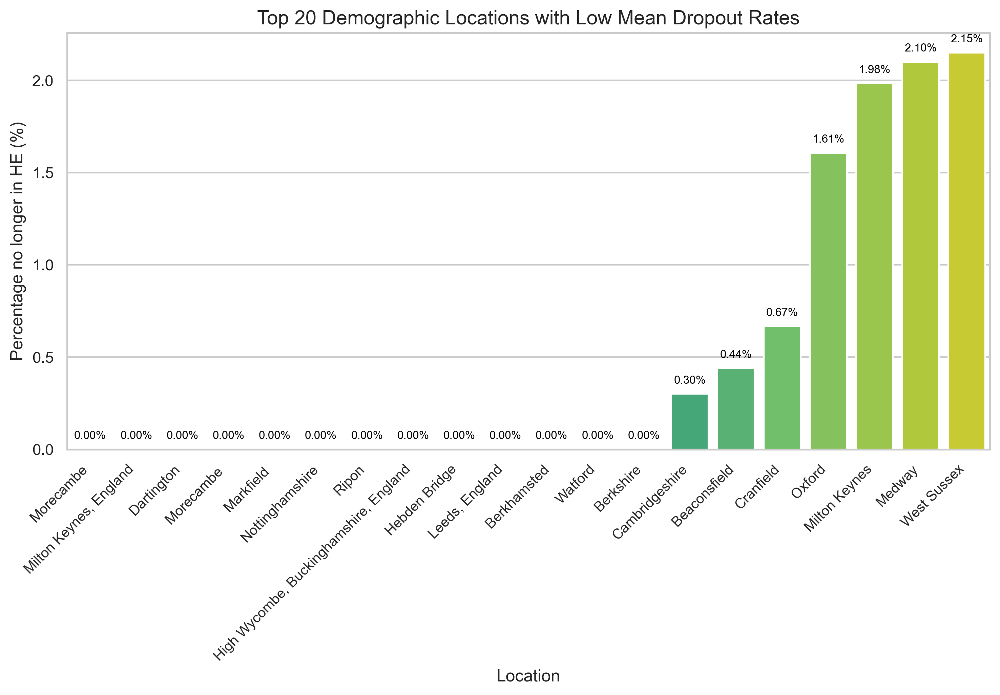

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have already calculated and stored top_20_lowest_dropout_locations

# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 7), dpi=300)  # Adjusted figure size and DPI

# Creating the bar plot
ax = sns.barplot(x=top_20_lowest_dropout_locations.index, y='Percentage no longer in HE (%)', data=top_20_lowest_dropout_locations, palette="viridis")
plt.xticks(rotation=45, ha="right", fontsize=10)  # Adjusted font size and rotation
plt.xlabel('Location', fontsize=12)  # Adjusted font size
plt.ylabel('Percentage no longer in HE (%)', fontsize=12)  # Adjusted font size
plt.title('Top 20 Demographic Locations with Low Mean Dropout Rates', fontsize=14)

# Adding data labels above the bars
for i, v in enumerate(top_20_lowest_dropout_locations['Percentage no longer in HE (%)']):
    ax.text(i, v + max(top_20_lowest_dropout_locations['Percentage no longer in HE (%)']) * 0.02, f'{v:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

# Adjusting plot layout
plt.tight_layout()

plt.savefig('low_dropout_locations.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


## Top 20 Demographic Locations with High Mean Percentage no longer in HE (%)

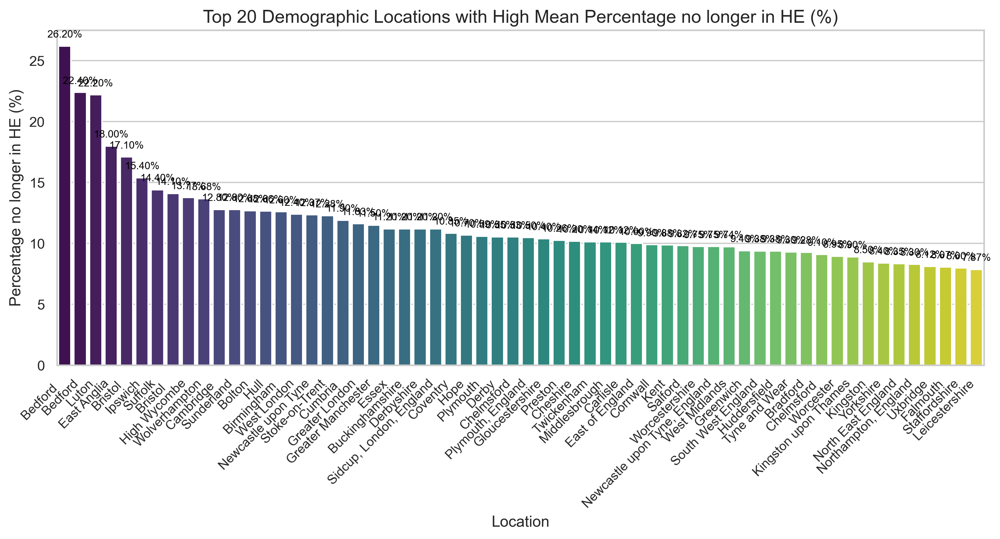

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have already calculated and stored top_20_locations

# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(11, 6), dpi=300)  # Adjusted figure size and DPI

# Creating the bar plot
ax = sns.barplot(x=top_20_locations.index, y='Percentage no longer in HE (%)', data=top_20_locations, palette="viridis")
plt.xticks(rotation=45, ha="right", fontsize=10)  # Adjusted font size and rotation
plt.xlabel('Location', fontsize=12)  # Adjusted font size
plt.ylabel('Percentage no longer in HE (%)', fontsize=12)  # Adjusted font size
plt.title('Top 20 Demographic Locations with High Mean Percentage no longer in HE (%)', fontsize=14)

# Adding data labels above the bars
for i, v in enumerate(top_20_locations['Percentage no longer in HE (%)']):
    ax.text(i, v + max(top_20_locations['Percentage no longer in HE (%)']) * 0.02, f'{v:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

# Adjusting plot layout
plt.tight_layout()

plt.savefig('demographic.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [86]:
df = pd.read_csv('top_20_locations.csv')

In [87]:
df

,Location,Percentage no longer in HE (%),Percentage who transfer to other UK HEP (%),Adjusted sector continue or qualify (%),Percentage who continue or qualify at same HEP (%)
0,Bedford,26.200000,7.800000,80.600000,0.610000
1,Luton,22.200000,6.100000,82.700000,0.530000
2,East Anglia,18.000000,3.200000,82.500000,0.800000
3,Bristol,17.100000,3.000000,84.400000,0.760000
4,Ipswich,15.400000,2.100000,85.975000,0.790000
5,Suffolk,14.400000,1.600000,86.300000,0.850000
6,Bristol,14.100000,2.800000,85.400000,0.770000
7,High Wycombe,13.766667,3.566667,83.266667,0.530000
8,Wolverhampton,13.675000,2.900000,85.350000,0.432500
9,Cambridge,12.800000,3.200000,83.600000,0.390000


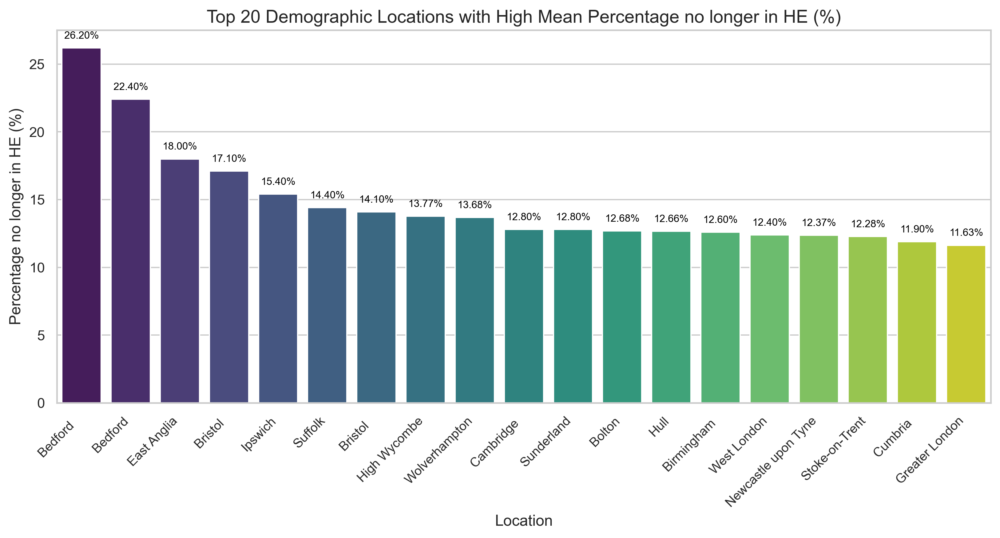

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have already calculated and stored top_20_locations
top_20_locations = top_20_locations.drop(top_20_locations.index[2])
# Keeping only the top 20 rows
top_20_locations = top_20_locations.head(20)


# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(11, 6), dpi=300)  # Adjusted figure size and DPI

# Creating the bar plot
ax = sns.barplot(x=top_20_locations.index, y='Percentage no longer in HE (%)', data=top_20_locations, palette="viridis")
plt.xticks(rotation=45, ha="right", fontsize=10)  # Adjusted font size and rotation
plt.xlabel('Location', fontsize=12)  # Adjusted font size
plt.ylabel('Percentage no longer in HE (%)', fontsize=12)  # Adjusted font size
plt.title('Top 20 Demographic Locations with High Mean Percentage no longer in HE (%)', fontsize=14)

# Adding data labels above the bars
for i, v in enumerate(top_20_locations['Percentage no longer in HE (%)']):
    ax.text(i, v + max(top_20_locations['Percentage no longer in HE (%)']) * 0.02, f'{v:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

# Adjusting plot layout
plt.tight_layout()

plt.savefig('demographic.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


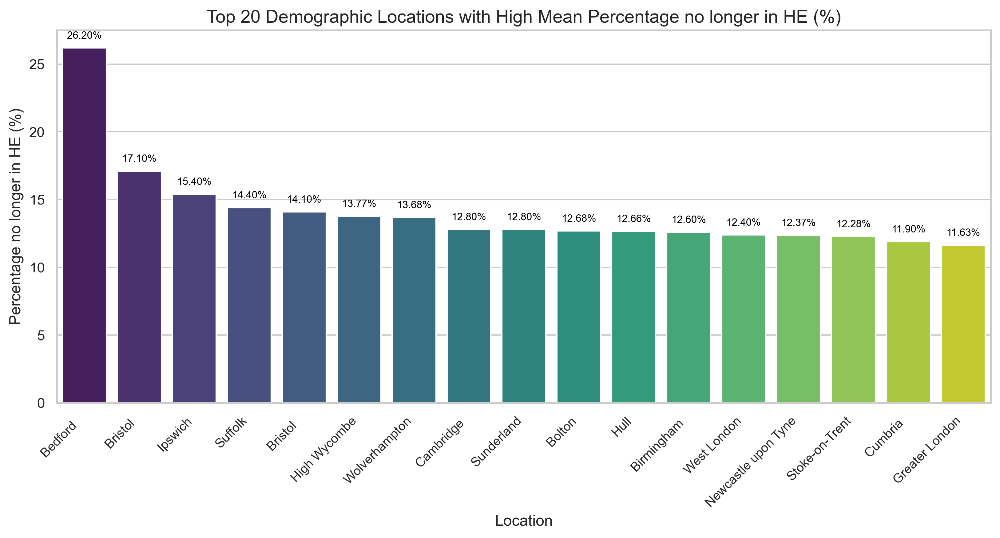

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have already calculated and stored top_20_locations

# Keeping only the top 20 rows
top_20_locations = top_20_locations.head(20)

# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(11, 6), dpi=300)  # Adjusted figure size and DPI

# Creating the bar plot
top_20_locations = top_20_locations.drop(top_20_locations.index[1])

ax = sns.barplot(x=top_20_locations.index, y='Percentage no longer in HE (%)', data=top_20_locations, palette="viridis")
plt.xticks(rotation=45, ha="right", fontsize=10)  # Adjusted font size and rotation
plt.xlabel('Location', fontsize=12)  # Adjusted font size
plt.ylabel('Percentage no longer in HE (%)', fontsize=12)  # Adjusted font size
plt.title('Top 20 Demographic Locations with High Mean Percentage no longer in HE (%)', fontsize=14)

# Adding data labels above the bars
for i, v in enumerate(top_20_locations['Percentage no longer in HE (%)']):
    ax.text(i, v + max(top_20_locations['Percentage no longer in HE (%)']) * 0.02, f'{v:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

# Adjusting plot layout
plt.tight_layout()

plt.savefig('demographic_completed_and perfect.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


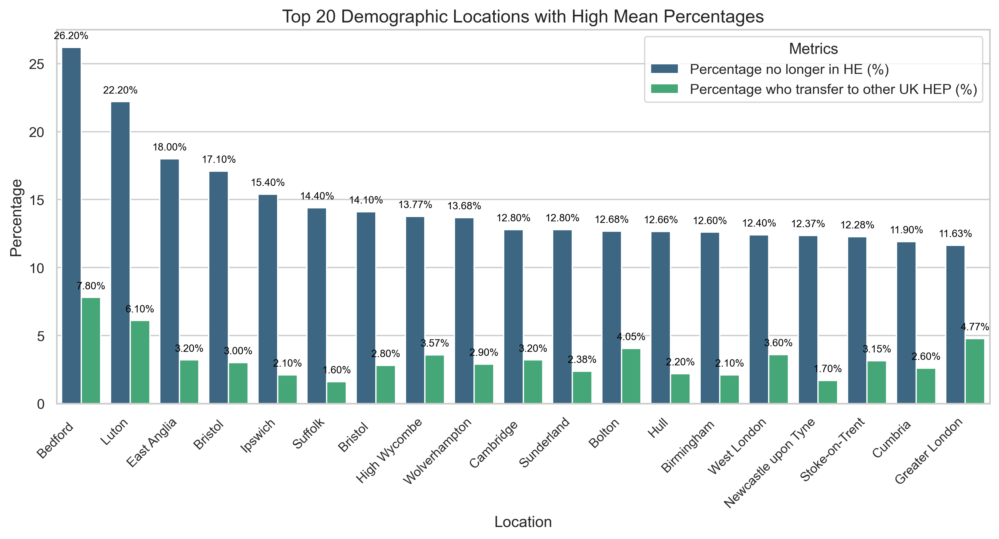

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have already calculated and stored top_20_locations

# Reshape the DataFrame to have the required format
stacked_df = top_20_locations[['Percentage no longer in HE (%)', 'Percentage who transfer to other UK HEP (%)']].stack().reset_index()
stacked_df.columns = ['Location', 'Metric', 'Percentage']

# Drop rows with indices 2 and 3 (0-based indexing)
stacked_df = stacked_df.drop(index=[2, 3])

# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(11, 6), dpi=300)  # Adjusted figure size and DPI

# Creating the stacked bar plot
ax = sns.barplot(x='Location', y='Percentage', hue='Metric', data=stacked_df, palette="viridis")

# Adding data labels above the bars for both categories
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=8, color='black', xytext=(0, 5), textcoords='offset points')

# Adjusting plot properties
plt.xticks(rotation=45, ha="right", fontsize=10)  # Adjusted font size and rotation
plt.xlabel('Location', fontsize=12)  # Adjusted font size
plt.ylabel('Percentage', fontsize=12)  # Adjusted font size
plt.title('Top 20 Demographic Locations with High Mean Percentages', fontsize=14)
plt.legend(title="Metrics")

# Adjusting plot layout
plt.tight_layout()

plt.savefig('demographic_stacked.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


In [105]:
top_20_locations

,Percentage no longer in HE (%),Percentage who transfer to other UK HEP (%),Adjusted sector continue or qualify (%),Percentage who continue or qualify at same HEP (%),Location
Location,,,,,
Bedford,26.200000,7.800000,80.600000,0.610000,Bedford
Bedford,22.400000,7.600000,82.900000,0.600000,Bedford
Luton,22.200000,6.100000,82.700000,0.530000,Luton
East Anglia,18.000000,3.200000,82.500000,0.800000,East Anglia
Bristol,17.100000,3.000000,84.400000,0.760000,Bristol
Ipswich,15.400000,2.100000,85.975000,0.790000,Ipswich
Suffolk,14.400000,1.600000,86.300000,0.850000,Suffolk
Bristol,14.100000,2.800000,85.400000,0.770000,Bristol
High Wycombe,13.766667,3.566667,83.266667,0.530000,High Wycombe


In [70]:
top_20_locations

,Percentage no longer in HE (%),Percentage who transfer to other UK HEP (%),Adjusted sector continue or qualify (%),Percentage who continue or qualify at same HEP (%)
Location,,,,
Bedford,26.200000,7.800000,80.600000,0.610000
Bedford,22.400000,7.600000,82.900000,0.600000
Luton,22.200000,6.100000,82.700000,0.530000
East Anglia,18.000000,3.200000,82.500000,0.800000
Bristol,17.100000,3.000000,84.400000,0.760000
Ipswich,15.400000,2.100000,85.975000,0.790000
Suffolk,14.400000,1.600000,86.300000,0.850000
Bristol,14.100000,2.800000,85.400000,0.770000
High Wycombe,13.766667,3.566667,83.266667,0.530000


In [68]:
top_20_locations

,Percentage no longer in HE (%),Percentage who transfer to other UK HEP (%),Adjusted sector continue or qualify (%),Percentage who continue or qualify at same HEP (%)
Location,,,,
Bedford,26.200000,7.800000,80.600000,0.610000
Bedford,22.400000,7.600000,82.900000,0.600000
Luton,22.200000,6.100000,82.700000,0.530000
East Anglia,18.000000,3.200000,82.500000,0.800000
Bristol,17.100000,3.000000,84.400000,0.760000
Ipswich,15.400000,2.100000,85.975000,0.790000
Suffolk,14.400000,1.600000,86.300000,0.850000
Bristol,14.100000,2.800000,85.400000,0.770000
High Wycombe,13.766667,3.566667,83.266667,0.530000


adding the actual values of no longer and trasfered

In [42]:
import pandas as pd

# Assuming your DataFrame is named df
mean_columns = ['Percentage no longer in HE (%)', 'Percentage who transfer to other UK HEP (%)']
mean_df = df.groupby(['Location'])[mean_columns].mean()

# Adding the desired columns to the mean DataFrame
mean_df['Number no longer in HE'] = df.groupby(['Location'])['Number no longer in HE'].sum()
mean_df['Number who transfer to other UK HEP'] = df.groupby(['Location'])['Number who transfer to other UK HEP'].sum()

# Print the mean DataFrame with the added columns
pd.DataFrame(mean_df)


,Percentage no longer in HE (%),Percentage who transfer to other UK HEP (%),Number no longer in HE,Number who transfer to other UK HEP
Location,,,,
Manchester,4.000,3.100000,210,165.0
Bath,3.520,1.593333,955,445.0
"Bath, England",2.800,0.000000,0,0.0
Beaconsfield,0.440,0.000000,0,0.0
Bedford,22.400,7.600000,715,245.0
...,...,...,...,...
Wolverhampton,13.675,2.900000,2540,530.0
Worcester,8.950,1.825000,830,170.0
Worcestershire,9.750,2.100000,455,95.0


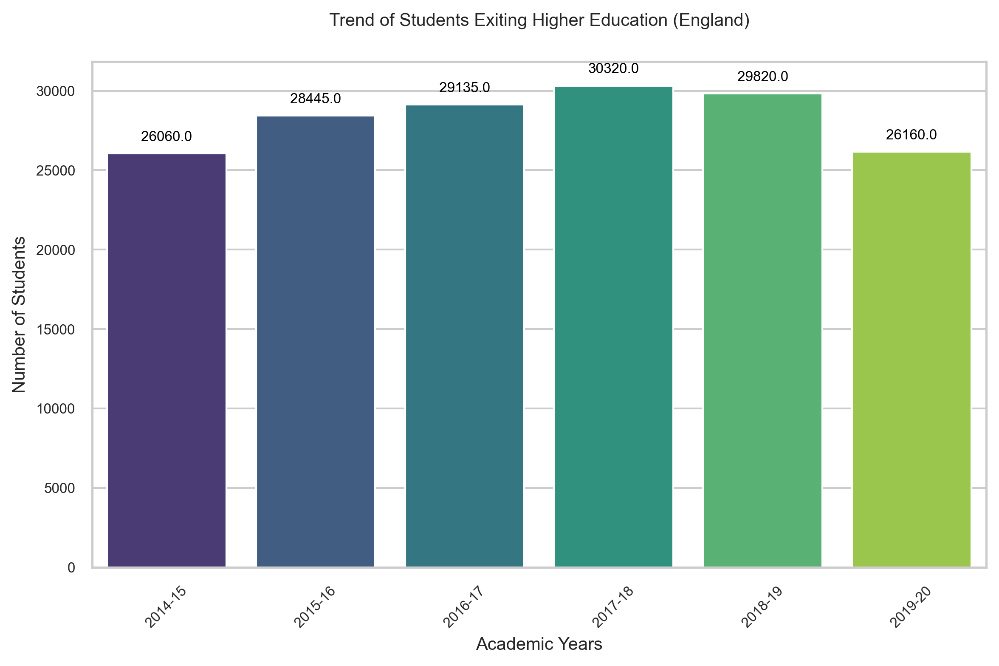

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Data preparation (assuming you have this part elsewhere)
years = ['2014-15', '2015-16', '2016-17', '2017-18', '2018-19', '2019-20']
data_values = England_Groupby.groupby(['County', 'Year']).sum()['Number no longer in HE'].values

# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(8, 5), dpi=300)  # Adjusted figure size and DPI

# Creating the bar plot
ax = sns.barplot(x=years, y=data_values, palette="viridis")
plt.xlabel('Academic Years', fontsize=10)  # Adjusted font size
plt.ylabel('Number of Students', fontsize=10)  # Adjusted font size

# Adding data labels above the bars
for i, v in enumerate(data_values):
    ax.text(i, v + max(data_values) * 0.02, str(v), ha='center', va='bottom', fontsize=8, color='black')  # Adjusted font size

# Adjusting plot layout
plt.xticks(rotation=45, fontsize=8)  # Adjusted font size and rotation
plt.yticks(fontsize=8)  # Adjusted font size
plt.tight_layout()

# Adding the title with adjusted positioning
plt.title('Trend of Students Exiting Higher Education (England)', fontsize=10, y=1.05)  # Adjusted font size and y-coordinate for title

# Saving the plot as an image (optional)
plt.savefig('research_paper_graph.png', dpi=300, bbox_inches='tight')  # Added bbox_inches to ensure tight image bounds

# Show the plot
plt.show()


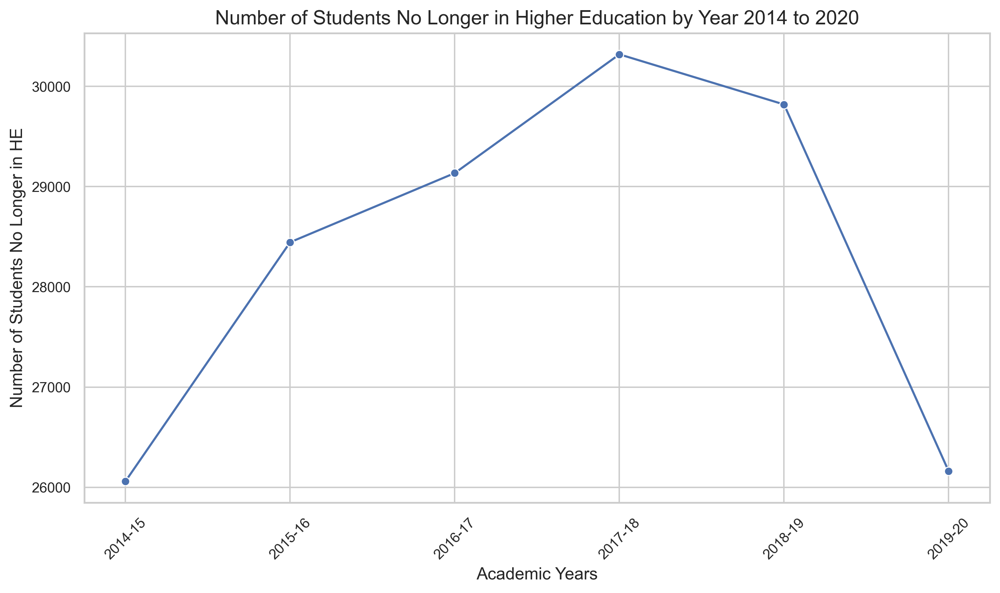

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Data preparation (assuming you have this part elsewhere)
years = ['2014-15', '2015-16', '2016-17', '2017-18', '2018-19', '2019-20']
data_values = England_Groupby.groupby(['County', 'Year']).sum()['Number no longer in HE']

# Setting up the plot style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6), dpi=300)

# Creating the line plot
sns.lineplot(x=years, y=data_values, marker='o', color='b')
plt.xlabel('Academic Years', fontsize=12)
plt.ylabel('Number of Students No Longer in HE', fontsize=12)
plt.title('Number of Students No Longer in Higher Education by Year 2014 to 2020', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)

# Adjusting plot layout
plt.tight_layout()

# Saving the plot as an image (optional)
plt.savefig('dropout_line_plot.png', dpi=300)

# Show the plot
plt.show()


# Droupout and transfer 

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Data preparation (assuming you have this part elsewhere)
years = ['2014-15', '2015-16', '2016-17', '2017-18', '2018-19', '2019-20']
data_values = England_Groupby.groupby(['County', 'Year']).sum()['Number no longer in HE']
transfer_values = England_Groupby.groupby(['County', 'Year']).sum()['Number who transfer to other UK HEP']

# Setting up the plot style
sns.set(style="whitegrid")

# Creating subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 6), dpi=900)

# Creating the line plot for Number of Students No Longer in HE in the first subplot
sns.lineplot(x=years, y=data_values, marker='o', color='b', ax=axs[0])
axs[0].set_xlabel('Academic Years', fontsize=12)
axs[0].set_ylabel('Number of Students No Longer in HE', fontsize=12)
axs[0].set_title('Number of Students No Longer in Higher Education', fontsize=14)
axs[0].set_xticklabels(years, rotation=45, fontsize=10)
axs[0].set_yticklabels(axs[0].get_yticks(), fontsize=10)
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].grid(True)
axs[0].set_axisbelow(True)

# Creating the line plot for Number who transfer to other UK HEP in the second subplot
sns.lineplot(x=years, y=transfer_values, marker='o', color='g', ax=axs[1])
axs[1].set_xlabel('Academic Years', fontsize=12)
axs[1].set_ylabel('Number of Students Transfer to Other UK HEP', fontsize=12)
axs[1].set_title('Number of Students Transfer to Other UK HEP', fontsize=14)
axs[1].set_xticklabels(years, rotation=45, fontsize=10)
axs[1].set_yticklabels(axs[1].get_yticks(), fontsize=10)
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].grid(True)
axs[1].set_axisbelow(True)

# Adjusting overall layout
plt.tight_layout()

# Saving the plot as an image
plt.savefig('dropout_transfer_subplots.png', dpi=1300)

# Show the plot
plt.show()


C:\Users\Siddharth\AppData\Local\Temp\ipykernel_24748\3705525936.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(years, rotation=45, fontsize=10)
C:\Users\Siddharth\AppData\Local\Temp\ipykernel_24748\3705525936.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_yticklabels(axs[0].get_yticks(), fontsize=10)
C:\Users\Siddharth\AppData\Local\Temp\ipykernel_24748\3705525936.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels(years, rotation=45, fontsize=10)
C:\Users\Siddharth\AppData\Local\Temp\ipykernel_24748\3705525936.py:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_yticklabels(axs[1].get_yticks(), fontsize=10)


In [16]:
data_values

County   Year   
England  2014-15    26060
         2015-16    28445
         2016-17    29135
         2017-18    30320
         2018-19    29820
         2019-20    26160
Name: Number no longer in HE, dtype: int64

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Data preparation (assuming you have this part elsewhere)
years = ['2014-15', '2015-16', '2016-17', '2017-18', '2018-19', '2019-20']
data_values = England_Groupby.groupby(['County', 'Year']).sum()['Number no longer in HE']

# Setting up the plot style
sns.set(style="whitegrid")

# Creating the line plot for Number of Students No Longer in HE
plt.figure(figsize=(11, 6), dpi=900)
sns.lineplot(x=years, y=data_values, marker='o', color='b')
plt.xlabel('Academic Years', fontsize=12)
plt.ylabel('Number of Students No Longer in HE', fontsize=12)
plt.title('Number of Students No Longer in Higher Education', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True)
plt.tight_layout()

# Saving the plot as an image
plt.savefig('no_longer_in_HE_plot.png', dpi=1300)

# Show the plot
plt.show()


# Descriptive statistics

In [31]:
import pandas as pd

# Data preparation (assuming you have this part elsewhere)
data_values = England_Groupby.groupby(['County', 'Year']).sum()['Number no longer in HE'].values

# Calculate statistics using Pandas
statistics = {
    'Frequency': len(data_values),
    'Percentage': (data_values.sum() / data_values.sum()) * 100,
    'Min': min(data_values),
    'Max': max(data_values),
    'Standard Deviation': data_values.std(),
    'Median': pd.Series(data_values).median()
}

# Create a DataFrame from the statistics dictionary
statistics_df = pd.DataFrame(statistics, index=[0])

# Display the DataFrame
print(statistics_df)


   Frequency  Percentage      Min      Max  Standard Deviation   Median
0          6       100.0  26060.0  30320.0         1668.481512  28790.0


In [32]:
England_Groupby.groupby(['County', 'Year']).sum()['Number no longer in HE']

County   Year   
England  2014-15    26060.0
         2015-16    28445.0
         2016-17    29135.0
         2017-18    30320.0
         2018-19    29820.0
         2019-20    26160.0
Name: Number no longer in HE, dtype: float64

In [33]:
England_Groupby.groupby(['County', 'Year']).sum().describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Total full-time entrants,6.0,356620.833333,10959.435851,337750.00,354658.7500,358890.000,359468.750,371285.00
Number who continue or qualify at same HEP,6.0,317835.000000,10229.290298,302740.00,315575.0000,318217.500,318370.000,334720.00
Percentage who continue or qualify at same HEP (%),6.0,227.855000,28.206135,188.35,206.2225,238.185,248.555,254.83
Adjusted sector continue or qualify (%),6.0,14805.716667,559.829329,13736.00,14761.3750,14966.800,15149.575,15261.30
Number who transfer to other UK HEP,6.0,10411.666667,819.747929,8930.00,10226.2500,10622.500,10872.500,11245.00
Percentage who transfer to other UK HEP (%),6.0,477.450000,46.000946,396.40,462.4250,491.100,511.600,514.80
Adjusted sector transfer to other UK HEP (%),6.0,453.883333,44.281347,375.00,447.3250,457.150,478.750,504.00
Number no longer in HE,6.0,28323.333333,1827.729922,26060.00,26731.2500,28790.000,29648.750,30320.00
Percentage no longer in HE (%),6.0,1486.116667,161.572404,1243.20,1386.5000,1520.200,1603.725,1659.60
Benchmark (%),6.0,1473.400000,160.569063,1271.10,1341.6750,1505.550,1603.575,1634.90


# Percentage wise locations

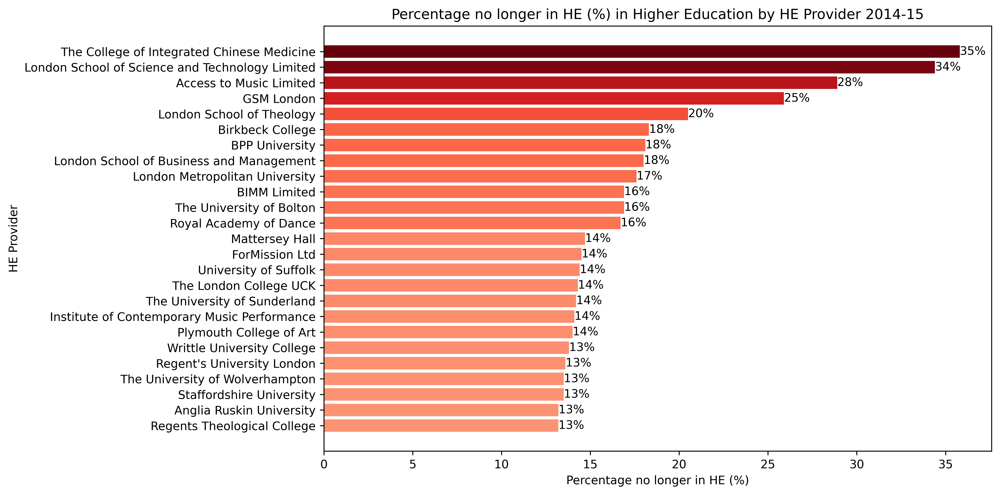

In [14]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2014-15'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider 2014-15')

# Add value labels on the bars with "%" symbol
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}%',  # Add "%" symbol
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()


plt.show()



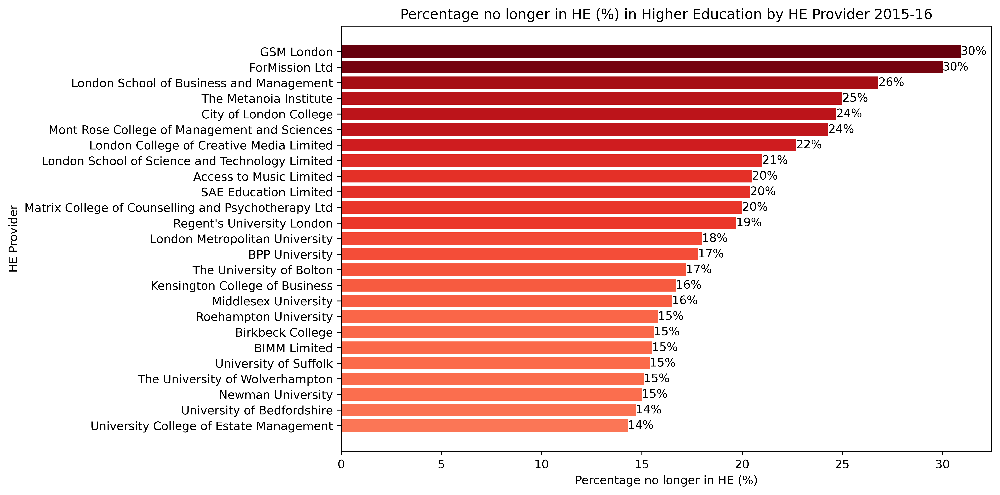

In [16]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2015-16'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider 2015-16')

# Add value labels on the bars with "%" symbol
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}%',  # Add "%" symbol
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()


plt.show()



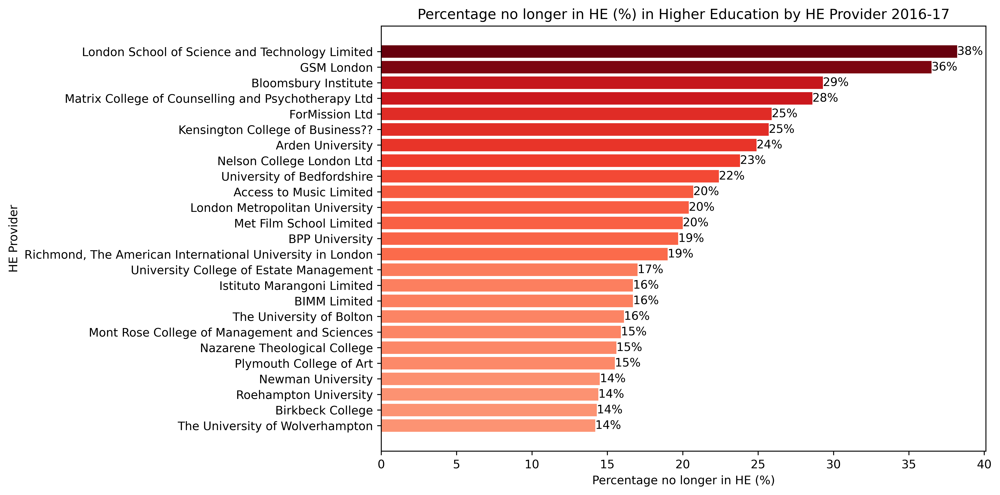

In [18]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2016-17'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider 2016-17')

# Add value labels on the bars with "%" symbol
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}%',  # Add "%" symbol
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()


plt.show()



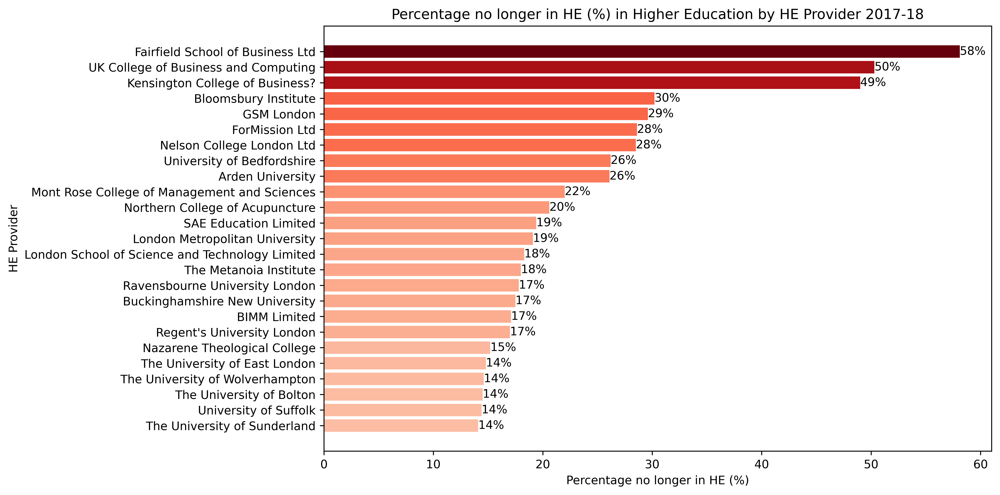

In [20]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2017-18'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider 2017-18')

# Add value labels on the bars with "%" symbol
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}%',  # Add "%" symbol
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()


plt.show()



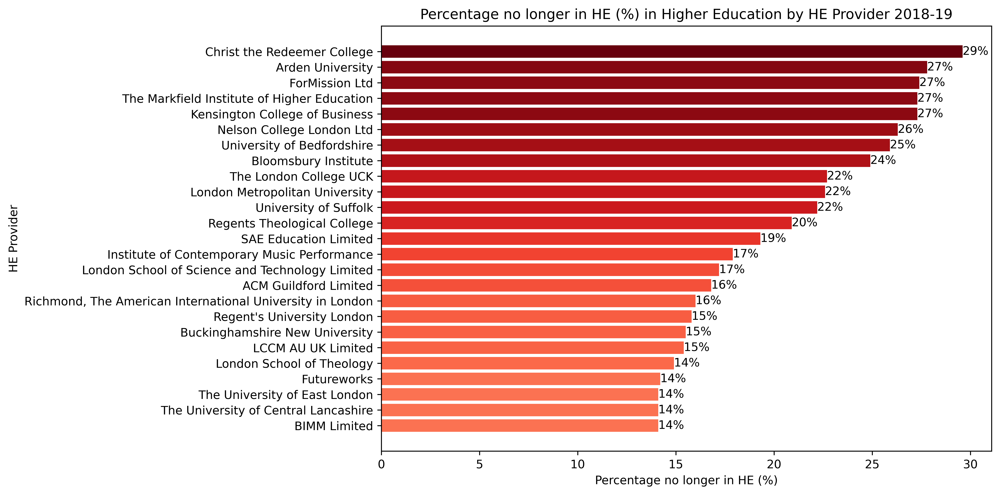

In [22]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2018-19'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider 2018-19')

# Add value labels on the bars with "%" symbol
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}%',  # Add "%" symbol
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()


plt.show()



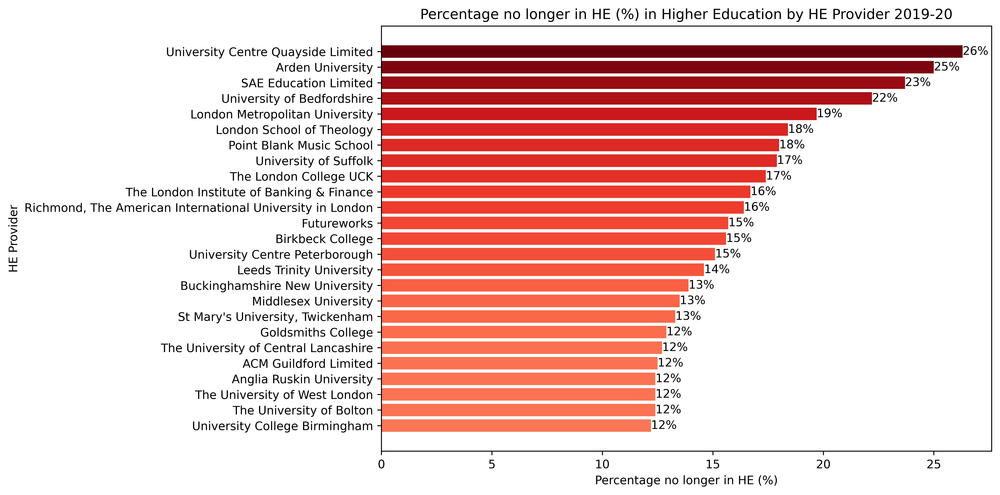

In [24]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2019-20'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider 2019-20')

# Add value labels on the bars with "%" symbol
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}%',  # Add "%" symbol
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()


plt.show()



In [78]:
df = pd.read_csv('A England.csv',encoding='latin1')

In [15]:
Oxbridge = df[df['HE PROVIDER'].isin(['The University of Oxford', 'The University of Cambridge'])]

In [171]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame for 'The University of Oxford' and 'The University of Cambridge'
filtered_df = df[df['HE PROVIDER'].isin(['The University of Oxford', 'The University of Cambridge'])]

Oxbridge = filtered_df.groupby(['Year','HE PROVIDER'])['Percentage no longer in HE (%)'].mean().reset_index()

#sns.barplot(x=Oxbridge['Year'],y=Oxbridge['Percentage no longer in HE (%)'])

In [177]:
Oxbridge.groupby('HE PROVIDER').describe()#.to_csv('stat Obbridge.csv')


Percentage no longer in HE (%)            \
                                                     count      mean   
HE PROVIDER                                                            
The University of Cambridge                            6.0  0.966667   
The University of Oxford                               6.0  1.200000   

                                                                     
                                  std  min    25%   50%    75%  max  
HE PROVIDER                                                          
The University of Cambridge  0.175119  0.7  0.900  0.95  1.075  1.2  
The University of Oxford     0.178885  0.9  1.125  1.25  1.300  1.4

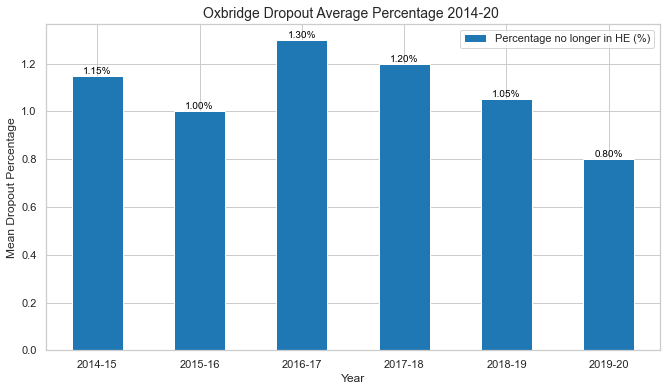

In [174]:
import matplotlib.pyplot as plt

# Assuming Oxbridge is your DataFrame
ax = Oxbridge.groupby('Year').mean().plot(kind='bar', figsize=(11, 6), color=['#1f77b4'])

# Adding title and labels
plt.title('Oxbridge Dropout Average Percentage 2014-20 ', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean Dropout Percentage', fontsize=12)

# Remove the x-axis label for better visibility (optional)
plt.tick_params(axis='x', labelrotation=0)

# Annotate the bars with data values and add '%'
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10, color='black')

# Save the plot
plt.savefig('oxbridge_dropout_percentage_by_years.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


# Russel group

In [227]:
df = pd.read_csv('A England.csv',encoding='latin1')
#df.drop('Unnamed: 0',axis=1,inplace=True)

universities = [
    "University College London",
    "University of Oxford",
    "University of Cambridge",
    "The University of Bristol",
    "The University of Birmingham",
    "The University of Manchester",
    "The University of Manchester",
    "Newcastle University",
    "Imperial College of Science, Technology and Medicine",
    "King's College London",
    "The University of Leeds",
    "The University of Exeter",
    "University of Nottingham",
    "The University of Sheffield",
    "Queen Mary University of London",
    "London School of Economics and Political Science",
    "The University of Southampton",
    "The Queen's Foundation for Ecumenical Theological Education",
    "University of Durham",
    "The University of York",
    "The University of Liverpool"
]


In [ ]:
Russel_group = df[df['HE PROVIDER'].isin(universities)]

In [220]:
filtered_russel = Russel_group.groupby('Year')['Percentage no longer in HE (%)'].mean().reset_index()


In [221]:
stats_of_Russel_group =  Russel_group.groupby('Year')['Percentage no longer in HE (%)'].describe().reset_index()

In [225]:
stats_of_Russel_group.drop('count',axis=1).to_csv('stat Russel.csv')

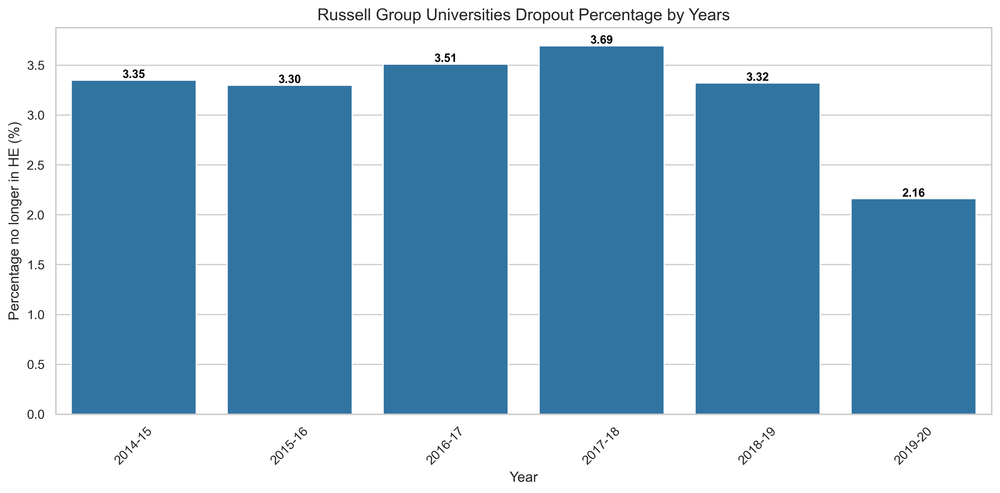

In [223]:
plt.figure(figsize=(12, 6), dpi=300)  # Adjusted figure size and DPI

# Creating the bar plot with standard deviation error bars
ax = sns.barplot(x=filtered_russel['Year'], y=filtered_russel['Percentage no longer in HE (%)'], color='#1f77b4')

# Adding title and labels
plt.title('Russell Group Universities Dropout Percentage by Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage no longer in HE (%)', fontsize=12)

# Remove the x-axis label rotation for better readability
plt.xticks(rotation=45)

# Annotate the bars with data values
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10, color='black', fontweight='bold')

# Save the plot
plt.tight_layout()
plt.savefig('russell_group_dropout_percentage_by_years.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


# Russel locations

In [179]:
university_locations_list = [
    "London",
    "Oxford",
    "Cambridge",
    "Bristol",
    "Birmingham",
    "Manchester",
    "Manchester",
    "Newcastle upon Tyne",
    "London",
    "London",
    "Leeds",
    "Exeter",
    "Nottingham",
    "Sheffield",
    "London",
    "London",
    "Southampton",
    "Birmingham",
    "Durham",
    "York",
    "Liverpool"
]


In [204]:
df[df['Location'].isin(university_locations_list) & df['HE PROVIDER'].isin(universities)]

,HE PROVIDER,Total full-time entrants,Number who continue or qualify at same HEP,Percentage who continue or qualify at same HEP (%),Adjusted sector continue or qualify (%),Number who transfer to other UK HEP,Percentage who transfer to other UK HEP (%),Adjusted sector transfer to other UK HEP (%),Number no longer in HE,Percentage no longer in HE (%),Benchmark (%),Standard deviation (%),HE providerÂs average contribution to benchmark (%),Average number of HE providers in comparison,County,Year,Location,Churn Level
15,The University of Birmingham,5395,5125,0.30,94.3,90.0,1.7,1.9,180,3.3,3.8,0.30,4.6,79.7,England,2014-15,Birmingham,Low
25,The University of Bristol,4280,4085,0.33,95.5,70.0,1.7,1.6,125,2.9,2.9,0.33,5.6,67.1,England,2014-15,Bristol,Low
57,University of Durham,3435,3295,0.37,95.2,40.0,1.2,1.6,100,3.0,3.1,0.37,6.0,66.6,England,2014-15,Durham,Low
60,The Queen's Foundation for Ecumenical Theologi...,0,0,0.00,0.0,0.0,0.0,0.0,0,0.0,0.0,0.00,0.0,0.0,England,2014-15,Birmingham,Low
67,The University of Exeter,4420,4230,0.32,94.2,75.0,1.7,2.0,115,2.6,3.8,0.32,5.1,78.1,England,2014-15,Exeter,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1349,Queen Mary University of London,3935,3740,0.33,93.8,100.0,2.5,2.1,95,2.4,4.0,0.33,3.4,83.9,England,2019-20,London,Low
1379,The University of Sheffield,3625,3435,0.35,94.2,90.0,2.5,2.1,100,2.8,3.7,0.35,3.5,77.3,England,2019-20,Sheffield,Low
1382,The University of Southampton,3330,3195,0.36,94.7,55.0,1.6,2.0,80,2.5,3.3,0.36,3.0,80.0,England,2019-20,Southampton,Low
1397,University College London,2615,2505,0.40,95.9,50.0,1.9,1.7,65,2.4,2.4,0.40,4.5,60.7,England,2019-20,London,Low


# Other analysis

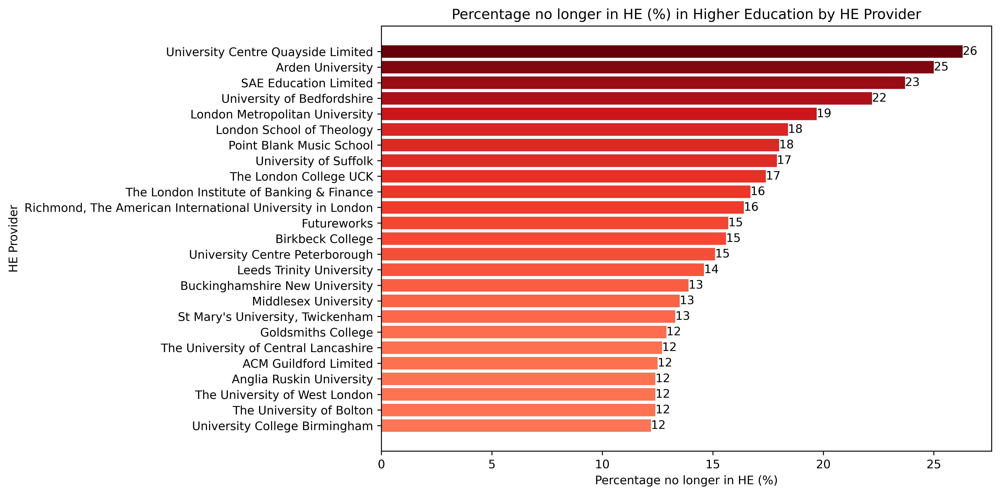

In [9]:
import matplotlib.pyplot as plt

df_sorted = df[df['Year'] == '2019-20'].sort_values(by='Percentage no longer in HE (%)', ascending=False)[:25]

# Reverse the order of the DataFrame to have longer bars at the top
df_sorted = df_sorted[::-1]

# Create a color gradient for the bars based on values
colors = plt.cm.Reds(df_sorted['Percentage no longer in HE (%)'] / df_sorted['Percentage no longer in HE (%)'].max())

# Create the horizontal stacked bar plot with color formatting
plt.figure(figsize=(12, 6), dpi=600)
bars = plt.barh(df_sorted['HE PROVIDER'], df_sorted['Percentage no longer in HE (%)'], color=colors)
plt.xlabel('Percentage no longer in HE (%)')
plt.ylabel('HE Provider')
plt.title('Percentage no longer in HE (%) in Higher Education by HE Provider')

# Add value labels on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width()):,}',
             va='center', ha='left', color='black', fontsize=10)

# Remove grid lines
plt.grid(False)

# Adjust spacing for better aesthetics
plt.tight_layout()

plt.show()


Finding overall percentage of transfered and no longer

In [330]:
import pandas as pd

# Calculate the overall percentage of transferred and no longer students
total_transfer = df['Number who transfer to other UK HEP'].sum()
total_no_longer = df['Number no longer in HE'].sum()
total_students = total_transfer + total_no_longer

percentage_transfer = (total_transfer / total_students) * 100
percentage_no_longer = (total_no_longer / total_students) * 100

print(f"Overall Percentage of Transferred Students: {percentage_transfer:.2f}%")
print(f"Overall Percentage of No Longer Students: {percentage_no_longer:.2f}%")


Overall Percentage of Transferred Students: 26.88%
Overall Percentage of No Longer Students: 73.12%


Each year wise percentage

In [332]:
import pandas as pd

# Group the DataFrame by year and calculate the sum of transferred and no longer students for each year
grouped_df = df.groupby('Year').agg({
    'Number who transfer to other UK HEP': 'sum',
    'Number no longer in HE': 'sum'
})

# Calculate the percentage of transferred and no longer students for each year
grouped_df['Percentage Transfer'] = (grouped_df['Number who transfer to other UK HEP'] / (grouped_df['Number who transfer to other UK HEP'] + grouped_df['Number no longer in HE'])) * 100
grouped_df['Percentage No Longer'] = (grouped_df['Number no longer in HE'] / (grouped_df['Number who transfer to other UK HEP'] + grouped_df['Number no longer in HE'])) * 100

pd.DataFrame(grouped_df)


,Number who transfer to other UK HEP,Number no longer in HE,Percentage Transfer,Percentage No Longer
Year,,,,
2014-15,8930.0,26060,25.521578,74.478422
2015-16,10170.0,28445,26.336916,73.663084
2016-17,10850.0,29135,27.135176,72.864824
2017-18,10880.0,30320,26.407767,73.592233
2018-19,11245.0,29820,27.383417,72.616583
2019-20,10395.0,26160,28.436602,71.563398


# Input Data Collection and Preparation

In [42]:
A = df.groupby(['County','Year','Location']).sum() 

## Feature Selection  Data for year 2014-15

In [129]:
# Assuming 'A' is your DataFrame
filtered_df = A[(A.index.get_level_values('Year') == '2014-15')]

# Reset the index to access "Location" as a regular column
filtered_df_reset = filtered_df.reset_index()

# Selecting the desired columns
result = filtered_df_reset[['Location', 'Number no longer in HE','Total full-time entrants']]

In [130]:
filtered_df_reset[['Location', 'Number no longer in HE','Year','Total full-time entrants']]

,Location,Number no longer in HE,Year,Total full-time entrants
0,"Bath, England",0.0,2014-15,70.0
1,Bedfordshire,0.0,2014-15,0.0
2,Berkshire,0.0,2014-15,15.0
3,Birmingham,1365.0,2014-15,19595.0
4,"Birmingham, England",85.0,2014-15,705.0
...,...,...,...,...
78,Twickenham,115.0,2014-15,1255.0
79,Winchester,125.0,2014-15,1905.0
80,Wolverhampton,630.0,2014-15,4675.0
81,Worcester,180.0,2014-15,2080.0


Top university no longer in each years

In [21]:
df = pd.read_csv('A England.csv',encoding='latin1')

# Assuming your DataFrame is named df
# Filter the data for Anglia Ruskin University
anglia_ruskin_data = df[df['HE PROVIDER'] == 'Anglia Ruskin University']

# Group by year and sum the 'Number no longer in HE' column
anglia_ruskin_no_longer = anglia_ruskin_data.groupby('Year')['Number no longer in HE'].sum()

# Print the result
a = pd.DataFrame(anglia_ruskin_no_longer)


In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [23]:
survey = pd.read_csv('survery data of anglina university top worst.csv')

In [24]:
survey

,Year,Academic and Feedback CDISSAT,Acadamic Support Dissatisfication,teaching on my course,Organisation and managemnt,Learning Respurses,Student Voices
0,2015,0.75,0.50,0.42,0.38,0.42,0.32
1,2016,0.69,0.49,0.38,0.38,0.40,0.32
2,2017,0.76,0.48,0.53,0.61,0.36,0.92
3,2018,0.76,0.48,0.51,0.61,0.40,0.98
4,2019,0.73,0.48,0.53,0.57,0.39,0.96
5,2020,0.88,0.56,0.58,0.63,0.43,0.99


In [25]:
df = pd.read_csv('A England.csv',encoding='latin1')

# Assuming your DataFrame is named df
# Filter the data for Anglia Ruskin University
anglia_ruskin_data = df[df['HE PROVIDER'] == 'Anglia Ruskin University']

# Group by year and sum the 'Number no longer in HE' column
anglia_ruskin_no_longer = anglia_ruskin_data.groupby('Year')['Number no longer in HE'].sum()

# Print the result
a = pd.DataFrame(anglia_ruskin_no_longer)
survey = pd.read_csv('survery data of anglina university top worst.csv')


a.index = survey.index
merged = pd.concat([a,survey],axis=1)

In [26]:
merged

,Number no longer in HE,Year,Academic and Feedback CDISSAT,Acadamic Support Dissatisfication,teaching on my course,Organisation and managemnt,Learning Respurses,Student Voices
0,565,2015,0.75,0.50,0.42,0.38,0.42,0.32
1,670,2016,0.69,0.49,0.38,0.38,0.40,0.32
2,610,2017,0.76,0.48,0.53,0.61,0.36,0.92
3,680,2018,0.76,0.48,0.51,0.61,0.40,0.98
4,590,2019,0.73,0.48,0.53,0.57,0.39,0.96
5,755,2020,0.88,0.56,0.58,0.63,0.43,0.99


In [27]:
merged.drop('Year',axis=1,inplace=True)
merged.describe().transpose()[['mean','std','min','25%','50%','75%','max']]


,mean,std,min,25%,50%,75%,max
Number no longer in HE,645.000000,70.142712,565.00,595.0000,640.000,677.5000,755.00
Academic and Feedback CDISSAT,0.761667,0.063692,0.69,0.7350,0.755,0.7600,0.88
Acadamic Support Dissatisfication,0.498333,0.031252,0.48,0.4800,0.485,0.4975,0.56
teaching on my course,0.491667,0.075741,0.38,0.4425,0.520,0.5300,0.58
Organisation and managemnt,0.530000,0.117813,0.38,0.4275,0.590,0.6100,0.63
Learning Respurses,0.400000,0.024495,0.36,0.3925,0.400,0.4150,0.43
Student Voices,0.748333,0.332651,0.32,0.4700,0.940,0.9750,0.99


In [28]:
a = merged.describe().transpose()[['mean','std','min','25%','50%','75%','max']]

In [29]:
a.to_csv('merged stat.csv')

In [35]:
merged.columns = ['Number no longer in HE', 'Academic and Feedback CDISSAT',
       'Acadamic Support Dissatisfication', 'teaching on my course',
       'Organisation and management', 'Learning Responses', 'Student Voices']

In [37]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

 

# Normalize the columns
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(merged[['Number no longer in HE', 'Academic and Feedback CDISSAT',
       'Acadamic Support Dissatisfication', 'teaching on my course',
       'Organisation and management', 'Learning Responses', 'Student Voices']])
normalized_df = pd.DataFrame(normalized_data, columns=['Number no longer in HE', 'Academic and Feedback CDISSAT',
       'Acadamic Support Dissatisfication', 'teaching on my course',
       'Organisation and management', 'Learning Responses', 'Student Voices'])

# Calculate the correlation matrix
correlation_matrix = normalized_df.corr()

# Print the correlation matrix
print("Correlation matrix after normalization:")
pd.DataFrame(correlation_matrix) 

Correlation matrix after normalization:


,Number no longer in HE,Academic and Feedback CDISSAT,Acadamic Support Dissatisfication,teaching on my course,Organisation and management,Learning Responses,Student Voices
Number no longer in HE,1.000000,0.622268,0.679721,0.370812,0.412645,0.424878,0.348004
Academic and Feedback CDISSAT,0.622268,1.000000,0.855740,0.745565,0.607695,0.474320,0.537274
Acadamic Support Dissatisfication,0.679721,0.855740,1.000000,0.381632,0.190121,0.731542,0.124729
teaching on my course,0.370812,0.745565,0.381632,1.000000,0.950323,-0.075461,0.943167
Organisation and management,0.412645,0.607695,0.190121,0.950323,1.000000,-0.249495,0.986968
Learning Responses,0.424878,0.474320,0.731542,-0.075461,-0.249495,1.000000,-0.252815
Student Voices,0.348004,0.537274,0.124729,0.943167,0.986968,-0.252815,1.000000


In [31]:
merged.to_csv('merge all scale.csv')

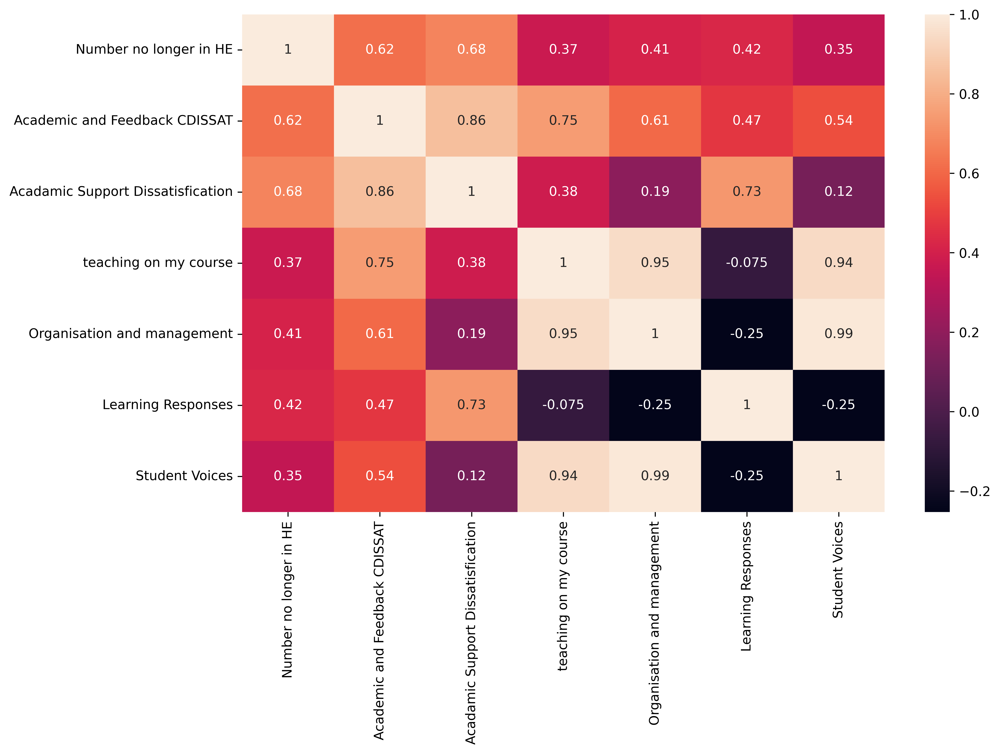

In [38]:
plt.figure(figsize=(11,7),dpi=600)
sns.heatmap(correlation_matrix,annot=True)
plt.savefig('dropuout and survery data.png',dpi=600,bbox_inches='tight')

In [166]:
import pandas as pd

# Assuming df is your DataFrame
result = df.groupby(['HE PROVIDER', 'Year']).sum()[['Number no longer in HE']]
filtered_result = result[result['Number no longer in HE'] > 500]

# Reset the index for better plotting
filtered_result = filtered_result.reset_index()

# Calculate the sum of "Number no longer in HE" for each HE provider
provider_sums = filtered_result.groupby('HE PROVIDER')['Number no longer in HE'].sum()

# Calculate the average of the sum
average_sum = provider_sums.mean()

# Find HE providers that are below the average
providers_below_average = provider_sums[provider_sums < average_sum]

print("HE Providers Below Average:")
print(providers_below_average)


HE Providers Below Average:
HE PROVIDER
Buckinghamshire New University      1440
Coventry University                 1305
De Montfort University              1700
Liverpool John Moores University    1650
Middlesex University                1850
Roehampton University               1040
Sheffield Hallam University          540
The University of East London        510
The University of Salford            545
The University of Sunderland         525
University of Suffolk               1245
Name: Number no longer in HE, dtype: int64
